# Generate Stimuli for Gaze Judgement Task

In [234]:
from matplotlib import pyplot as plt
from scipy import ndimage
import seaborn as sb
import pandas as pd
import imageio
import math
import numpy as np
import ffmpeg
import random
import os
import glob
import csv

# Grab batches of gaze data 

### function for getting viewing data

In [235]:
def rename_df(splitso, this_version):
    '''
    INPUT:
    splitso      - pandas dataframe containing full gaze data from one subject for one image
    this_version - version of the image list this data is from
    
    OUTPUT:
    splitso      - original dataframe but with appropriately renamed columns for easy analysis
    '''
    
    if this_version == 1:
        splitso = splitso.rename(columns={0: "Time", 1: "Type", 2:"Trial", 3:"L POR X [px]",
                                          4:"L POR Y [px]", 5:"R POR X [px]", 6:"R POR Y [px]",
                                          7:"Timing", 8:"Pupil Confidence", 9:"L Plane", 10:"R Plane",
                                         11:"L Event Info", 12:"R Event Info", 13:"Stimulus"})
    elif this_version == 2:
        splitso = splitso.rename(columns={0: "Time", 1: "Type", 2:"Trial", 3:"L POR X [px]",
                                          4:"L POR Y [px]", 5:"R POR X [px]", 6:"R POR Y [px]",
                                          7:"Timing", 8:"Pupil Confidence", 9:"L Plane", 10:"R Plane",
                                         13:"L Event Info", 14:"R Event Info", 15:"Stimulus"})
    else:
        print('Incoherent list version number!')
        
    return(splitso)


def make_splitso(sub, dat_string, this_list, this_version):
    '''
    INPUT:
    dat_string - path to trial data
    
    OUTPUT:
    splitso    - pandas dataframe containing desired trial data w/ appropriate column names, float values, etc.
    '''
    
    df         = pd.read_csv(dat_string, sep=" ", skiprows=None, skipinitialspace=True, skip_blank_lines=True, header=41)
    splitso    = df['Time\tType\tTrial\tL'].str.split('\t', expand=True)
    splitso    = rename_df(splitso, this_version)[1:]
    
    splitso['L POR X [px]'] = splitso['L POR X [px]'].astype(float)
    splitso['L POR Y [px]'] = splitso['L POR Y [px]'].astype(float)
    splitso['subject']      = sub
    splitso['list']         = this_list
    splitso['version']      = this_version
    
    return(splitso)
    

def get_gaze(sub, this_list, this_version, image):
    '''
    INPUTS:
    sub          - string indicating subject ID (example: 'pp151')
    this_list    - int indicating which List the image is from (1, 2, or 3)
    this_version - int indicating which Version of this_list the data is from (1 or 2)
    
    OUTPUTS:
    gaze_data    - df containing sub's full gaze data for image 
    '''

    subdir     = '../Free_viewing/List'+str(this_list)+'_ALL/'+sub+'/eye'
    eye_trials = os.listdir(subdir)
    null       = 0

    for trial in eye_trials:
        if trial!='.DS_Store' and trial[-3:]!='csv':

            dat_string = subdir+'/'+trial
            splitso    = make_splitso(sub, dat_string, this_list, this_version)

            if splitso[splitso['Stimulus']==image].shape[0]>0:
                free_view = splitso[splitso['Stimulus']==image]
                null+=1
    if null==0:
        print("Reportedly, "+sub+" has no values in df for this image: "+image)
        free_view = np.nan
        
    return(free_view)


def get_fixies(free_view):
    """
    INPUT:
    free_view  - gaze data from one subject for one image
    
    OUTPUT:
    fixie_list - list of ints of length #-of-fixations
               - the value of each int reflects which chunk the corresponding fixation point belongs to
    """
    
    events = list(free_view['L Event Info'])
    fixation_chunk = 1 
    fixie_list = []

    for idx,x in enumerate(events[:-1]):
        if x == 'Fixation':
            fixie_list.append(fixation_chunk)
            if events[idx+1] != 'Fixation':
                fixation_chunk += 1
    
    if events[-1] == 'Fixation':
        if events[-2] == 'Fixation':
            fixie_list.append(fixation_chunk)
        else:
            fixie_list.append(fixation_chunk+1)
                
    return fixie_list


def check_fix_numbers(fixie_list, free_view):
    '''
    INPUT:
    fixie list - output of get_fixies function
    free_view  - output of get_gaze function
    
    OUTPUT:
    value      - boolean - True if fixie_list is correct length
    '''
    for x,y in zip(fixie_list, fixation_data):
        if len(x)!=y[y['L Event Info']=='Fixation'].shape[0]:
            value = False
        else:
            value = True
    return(value)

def make_the_dicts(free_view):
    '''
    INPUT: 
    splitso - pandas dataframe containing gaze data from one subject for one image
    
    OUTPUT:
    dict    - dictionary format of data and image to pass into plotting functions
    '''
    
    xs = free_view[free_view['L Event Info']=='Fixation']['L POR X [px]'] 
    ys = free_view[free_view['L Event Info']=='Fixation']['L POR Y [px]'] 
    tuple_list = []
    
    for x,y in zip(xs,ys):
        tuple_list = tuple_list+[(np.rint(x),np.rint(y))]
        the_dict = {'image':free_view['Stimulus'][1], 'fixations': tuple_list, 'subject':free_view['subject'].unique(),'list':free_view['list'].unique(), 'version':free_view['version'].unique()} 
        
    return the_dict

In [236]:
fixations  = get_fixies(get_gaze('pp151',1, 1, '150273.bmp'))
dictionary = make_the_dicts(get_gaze('pp151',1,1, '150273.bmp'))

In [237]:
f2 = get_fixies(get_gaze('pp52',1, 2, '150273.bmp'))
d2 = make_the_dicts(get_gaze('pp52',1, 2, '150273.bmp'))

### Make a giant dataframe with:

gaze data, fixation data, number of chunks, scrambled chunk list


----------------------

### Things we need for movie making function(s):

- stim lists (from other notebook, done) --> includes list # and version #
- dicts from make_the_dicts
- fixies from get_fixies

Pipeline:
- first make all dicts, all fixies and store them
- check 'em out
    - how many blurbs per image?
    - how much randomness?
- THEN make the whole batch of movies at once

# KZ NOTE : FUNCTIONS ABOVE THIS CELL WORING :) 

# DIDEC Functions (from van Miltenberg et al., 2018)

In [238]:
# these functions are from : https://didec.uvt.nl/pages/download.html
# (see the second download link under "Images" section)
# any changed lines to the original functions have been commented "#KZ"

DISPLAY_SIZE = (1050, 1680)

def get_coords(entry):
    """
    Helper function to get coordinates from an entry.
    Own code.
    """
    x = round(float(entry['L POR X [px]']))
    y = round(float(entry['L POR Y [px]']))
    return x,y


def get_fixations(entries, remove_out_of_bounds=True):
    """
    Get the fixations from the BeGaze file, and return them in the PyGaze format.
    Own code.
    """
    coords = [get_coords(entry) for entry in entries
                                if entry['L Event Info'] == 'Fixation'
                                and entry['R Event Info'] == 'Fixation']
    if remove_out_of_bounds:
        height, width = DISPLAY_SIZE
        coords = [(x,y) for x,y in coords if x < width and y < height]
    return coords


def read_eye_data(filepath, remove_out_of_bounds=True):
    """
    Read the BeGaze data.
    Own code.
    """
    with open(filepath) as f:
        # There's a lot of lines that are just unnecessary..
        for i in range(41):
            _ = next(f) # Skip line
        reader = csv.DictReader(f, delimiter='\t')
        entries = list(reader)
        # The first entry is not a real entry but a message about the stimulus.
        message = entries[0]
        image = entries[0]['L POR X [px]'].split()[-1]
        del entries[0]
        return dict(image=image, fixations=get_fixations(entries, remove_out_of_bounds))


def buildFixMap(fixations, doBlur=True, sigma=19, display=(1050, 1680)):
    """
    Function to build a fixation map.
    Based on salicon.py
    """
    sal_map = np.zeros(display)
    for x,y in fixations:
        if y<=1050.00 and x<=1680.00:
            sal_map[int(y)][int(x)]=1
        else:
            print('one gazepoint detected out of bounds')
            # KZ #sal_map[y][x] = 1 
    if doBlur:
        sal_map = ndimage.filters.gaussian_filter(sal_map, sigma)
        sal_map -= np.min(sal_map)
        sal_map /= np.max(sal_map)
    return sal_map


def clean_heatmap(heatmap):
    """
    Remove numbers below the mean to make the visualization clearer.
    Own code.
    """
    lowbound = np.mean(heatmap[heatmap>0])
    heatmap[heatmap<lowbound] = np.NaN
    return heatmap


def CC_score(gtsAnn, resAnn):
    """
    Computer CC score. A simple implementation
    From the SALICON codebase.
    
    :param gtsAnn : ground-truth fixation map
    :param resAnn : predicted saliency map
    :return score: int : score
    """
    fixationMap = gtsAnn - np.mean(gtsAnn)
    if np.max(fixationMap) > 0:
        fixationMap = fixationMap / np.std(fixationMap)
    salMap = resAnn - np.mean(resAnn)
    if np.max(salMap) > 0:
        salMap = salMap / np.std(salMap)
    
    return np.corrcoef(salMap.reshape(-1), fixationMap.reshape(-1))[0][1]


# KZ added "isolated attention" option 
#def plot_heatmap(data, filename='test.pdf', alpha=0.7, cmap='jet', clean=True):
def plot_heatmap(data, filename='test.pdf', alpha=0.7, cmap='jet', clean=True, isolated=False, other=None, l=1):
    """
    Plot heatmap.
    Mostly modified from PyGaze.
    """
    # Load data
    image      = data['image']
    image_path = '/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List '+str(l)+'/'+data['image'] # IMAGE_PATHS[image]
    #KZ update from ndimage to imageio #image_data = ndimage.imread(image_path)
    image_data = imageio.imread(image_path)
    heatmap    = buildFixMap(data['fixations'])
    # Remove haze.
    if clean:
        heatmap = clean_heatmap(heatmap)
    
    # Matplotlib.
    # Borrows heavily from from Edwin Dalmaijer's `gazeplotter.py` script, from the PyGaze codebase.
    dpi = 100
    display_size = heatmap.shape
    figsize = (display_size[1]/dpi, display_size[0]/dpi)
    fig = plt.figure(figsize=figsize, dpi=dpi, frameon=False)
    ax = plt.Axes(fig, [0,0,1,1])
    ax.set_axis_off()
    fig.add_axes(ax)
    
    if isolated == False and other == None:
        ax.imshow(image_data)
        # KZ moved ax.imshow(image_data) into if statement for "isolated attention" option
    
    elif other != None:
        image_data= imageio.imread(other)
        ax.imshow(image_data)
        print(other)
        
    ax.imshow(heatmap, cmap=cmap, alpha=alpha)
    #KZ commented out: #fig.savefig(filename)

### Make movie stimuli

Running this cell will make VERIDICAL, SCRAMBLED, MISMATCHED, and ISOLATED attention stimuli.

It will take a very long time to run to completion.

In [239]:
def get_addin(q):
    '''
    INPUT:
    q - int indicating the number of the image that's being generated
    
    OUTPUT:
    addin - string to include in the jpeg filename so that files/filenames are ordered correctly for video compilation
    '''
    
    addin = '_'
    
    if q<10:
        addin = addin+'00'
    elif q>=10 and q<100:
        addin = addin+'0'
        
    return(addin)

def get_framerate():
    '''
    OUTPUTS: frame_rate - int - optimal framerate to produce 3 second video, rounded down to the nearest int
    '''
    num_images = 0
    for img in os.listdir('.'):
        if img[-3:]=='jpg':
            num_images+=1

    # total frames / total seconds  --> frames per second
    frame_rate = math.floor(num_images/3)
    
    return(frame_rate)

def remove_jpegs():
    '''
    removes all jpegs in current directory
    '''
    for file_name in os.listdir('.'):
        if file_name.endswith('.jpg'):
            os.remove(file_name)

In [260]:
def movie_maker(fixations, dictionary, this_list, this_version, stim_type, isolated=False):
    '''
    INPUTS:
    
    fixations  - pandas dataframe containing only fixation data from one subject viewing one image
    dictionary - dictionary containing two keys, one with the image name and one with the fixaiton coordinates 
    stim_type  - string describing the type of attention stimulus to make: veridical / scrambled / mismatched / reversed
    isolated   - boolean describing whether the attention will be isolated (True) or be overlaid on an image (False)
            
    OUTPUTS: 
    
    technically, none
    
    This will create and save two files: 
    - mp4 video of the attention video stimulus
    - csv containing video metadata
        - # of attention chunks (num_chunks)
        - order of attention chunks (order)
        - image filename (dictionary['image'])
        - subject ID (dictionary['subject'])
    '''
    
    # This function can make veridical and scrambled attention spotlight videos, isolated or overlaid on an image

    lengths = []; movie_frames = []; total_counter = 0
    order   = list(set(fixations))
    num_chunks = len(order)

    if len(order)>0:
        if stim_type=='scrambled':
            remainder = order[1:]
            np.random.shuffle(remainder)
            new_list = [order[0]] + list(remainder)
            order = new_list
            
        # for each fixation chunk 
        for x in order:
    
            length_counter = 0; tuple_list = []; total_list = []

            # for each item in fixie chunk list AND each tuple
            for a,b in zip(fixations, dictionary['fixations']):

                # if item from fixie chunk list is the number from first for statement:
                if a == x:
                    tuple_list.append(b)
                    total_counter += 1
                    total_list.append(total_counter)

            # pass into plotting function
            plot_heatmap({'image':dictionary['image'], 'fixations':tuple_list}, 
                         filename='/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List'+str(this_list)+'/' + dictionary['image'], 
                         alpha=.6, cmap="Greys_r", clean=False, isolated=isolated, other=None, l=this_list)
            
            # save jpegs    
            for q in total_list:
                addin = get_addin(q)
                plt.savefig(dictionary['image']+addin+str(q)+'.jpg')

        # determine frame rate given number of images
        framerate = get_framerate()

        if framerate!=0:
            ending = '_'+dictionary['subject'][0]+'_L'+str(this_list)+'_V'+str(this_version)+'_'+stim_type+'_freeview_iso'+str(isolated)

        # compile and save video
            (
            ffmpeg
            .input('*.jpg', pattern_type='glob', framerate=framerate)
            .output(dictionary['image']+ending+'.mp4')
            .run()
            )
            
            # remove leftover jpeg images
            remove_jpegs()

        else:
            print('framerate is zero for '+dictionary['image'])

            for file_name in os.listdir('.'):
                if file_name.endswith('.jpg'):
                    os.remove(file_name)
    else:
        print('len(k) <= 0: '+the_dict['image'])
        
    meta = pd.DataFrame({'image':dictionary['image'],'subject':dictionary['subject'],'num_chunks':num_chunks, 'order':[order]})
    meta.to_csv(dictionary['image']+ending+'.csv')
        

### Let's make some videos!

In [210]:
df = pd.read_csv('stim_df.csv')

In [35]:
def movie_maker_2(fixie_lists, dicts, stim_type='mismatch', map_only=False, other=None, this_list=1, this_image='image.bmp', other_sub='pp151'):
    '''
    inputs: lists of fixation chunks
            dictionaries of gaze dat
            
            stim_type : 'mismatch'
            map_only  : boolean
            
    output: mp4 video of the attention video stimuli
    '''
    
    for i,(fixie_list,the_dict) in enumerate(zip(fixie_lists,dicts)):

        lengths = []
        movie_frames  = []
        total_counter = 0
        
        k = list(set(fixie_list))
#         print(k)
#         print(len(k))
        
        if stim_type=='scrambled':
            new_list  = [k[0]]
            remainder = k[1:]
            np.random.shuffle(remainder)
            for z in remainder:
                new_list.append(z)
#             print(new_list)
#             print(len(new_list))
            k = new_list
            
        # for each individual fixation chunk number
        for x in k:

            # length counter - count number of timepoints in this chunk
            length_counter = 0

            # empty list to collect tuples
            tuple_list = []

            # collect the total counter for this list only
            total_list = []

            # for each item in fixie chunk list AND each tuple
            for a,b in zip(fixie_list, the_dict['fixations']):

                # if item from fixie chunk list is the number from first for statement:
                if a == x:
                    
#                     DISPLAY_SIZE = (1050, 1680)
#                     if b[0]<=1050.00 and b[1]<=1680.00:

                    # add tuple to current tuple list
                    tuple_list.append(b)

                    # add one to the length counter
                    length_counter += 1

                    # add one to total counter
                    total_counter += 1

                    total_list.append(total_counter)

            lengths.append(length_counter)

            # pass tuple list into plotting function
            this_dict = {'image':the_dict['image'], 'fixations':tuple_list}
            path      = '/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List'+str(this_list)+'/' #1/'
            
            im_path = path+other
            
            
            
#             if this_dict['image'] == '1592568.bmp':
#                 other = '150273.bmp'
#                 im_path = path + other #this_dict['image']
                
#             elif this_dict['image'] == '150273.bmp':
#                 other = '1592568.bmp'
#                 im_path = path + other

            plot_heatmap(this_dict, filename=im_path, alpha=.6, cmap="Greys_r", clean=False, map_only=map_only, other=im_path)

            for p,q in zip(range(0,length_counter),total_list):
                if q<10:
                    addin = '_00'
                elif q>=10 and q<100:
                    addin = '_0'
                else:
                    addin = '_'

                plt.savefig(this_dict['image']+addin+str(q)+'.jpg')

        # determine frame rate
        num_images = 0
        for img in os.listdir('.'):
            if img[-3:]=='jpg':
                num_images+=1
        
        # total frames / total seconds  --> frames per second
        frame_rate = math.floor(num_images/3)
        
        if map_only == False:
            ending = the_dict['subject'][0]+'_L'+str(this_list)+'_freeview_'+stim_type+'.mp4'
        else:
            ending = the_dict['subject'][0]+'_L'+str(this_list)+'_freeview_'+stim_type+'_mapOnly.mp4'
        
        (
        ffmpeg
        .input('*.jpg', pattern_type='glob', framerate=frame_rate)
        .output(str(i)+'_'+the_dict['image']+'_'+other+ending)
        .run()
        )

        for file_name in os.listdir('.'):
            if file_name.endswith('.jpg'):
                os.remove(file_name)

In [36]:
def movie_maker_3(dicts, stim_type='full', map_only=False, other=None):
    '''
    inputs: lists of fixation chunks
            dictionaries of gaze dat
            
            stim_type : 'mismatch'
            map_only  : boolean
            
    output: mp4 video of the attention video stimuli
    '''
    
    for the_dict in dicts:
        
        total_list = len(the_dict['gaze'])

        length_counter = 0
        # DISPLAY_SIZE = (1050, 1680)
            
        # for each individual fixation chunk number
        for x in the_dict['gaze']:
            
            
            centroid  = x
            
            fixations = [x]
            
            for a in range(1,10):
                fixations.append((x[0]+a, x[1]))
                fixations.append((x[0], x[1]+a))

            # pass tuple list into plotting function
            this_dict = {'image':the_dict['image'], 'fixations':fixations}
            path      = '/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List 1/'
            
            im_path = path+this_dict['image']
            

            plot_heatmap(this_dict, filename=im_path, alpha=.6, cmap="Greys_r", clean=False, map_only=map_only, other=None)

            #for p,q in zip(range(0,length_counter),total_list):
            if length_counter<10:
                addin = '_00'
            elif length_counter>=10 and length_counter<100:
                addin = '_0'
            else:
                addin = '_'

            plt.savefig(this_dict['image']+addin+str(length_counter)+'.jpg')
                
            length_counter+=1

        # determine frame rate
        num_images = 0
        for img in os.listdir('.'):
            if img[-3:]=='jpg':
                num_images+=1
        
        # total frames / total seconds  --> frames per second
        frame_rate = math.floor(num_images/3)
        
        if map_only == False:
            ending = the_dict['subject'][0]+'_L1V1_freeview_'+stim_type+'_FULL.mp4'
        else:
            ending = the_dict['subject'][0]+'_L1V1_freeview_'+stim_type+'_FULL_mapOnly.mp4'
        
        (
        ffmpeg
        .input('*.jpg', pattern_type='glob', framerate=frame_rate)
        .output(str(i)+'_'+the_dict['image']+'_'+other+ending)
        .run()
        )

        for file_name in os.listdir('.'):
            if file_name.endswith('.jpg'):
                os.remove(file_name)

### Make the movies!

Let's start by making the stimuli we want from List 1

In [243]:
get_framerate()

198

1
[6, 7, 8, 9, 4, 2, 3, 5]
[1, 6, 7, 8, 9, 4, 2, 3, 5]


ffmpeg version 4.4 Copyright (c) 2000-2021 the FFmpeg developers
  built with Apple clang version 11.0.0 (clang-1100.0.33.17)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.4_2 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-avresample --enable-videotoolbox
  libavutil      

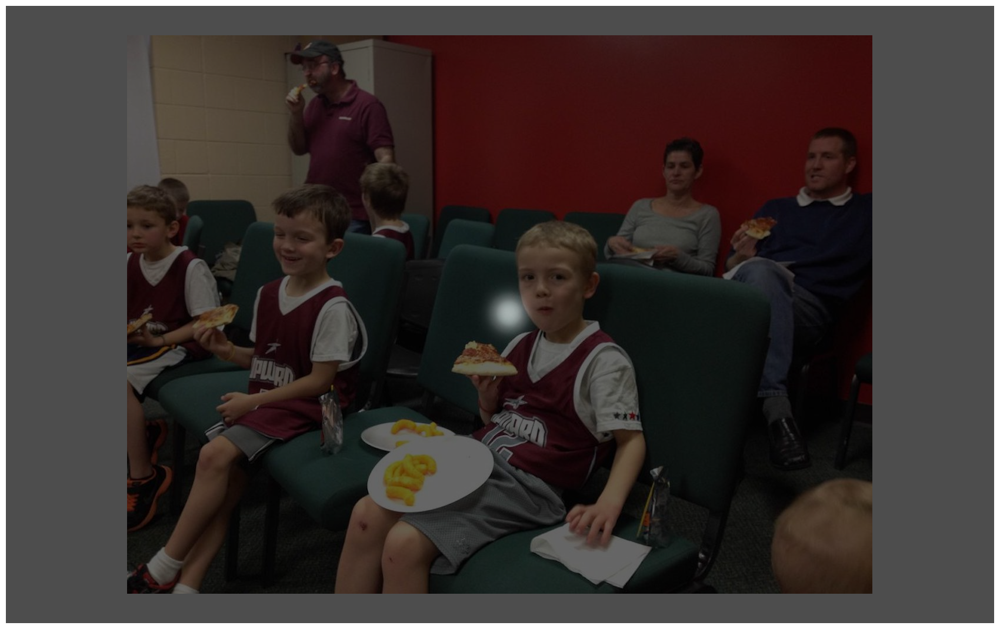

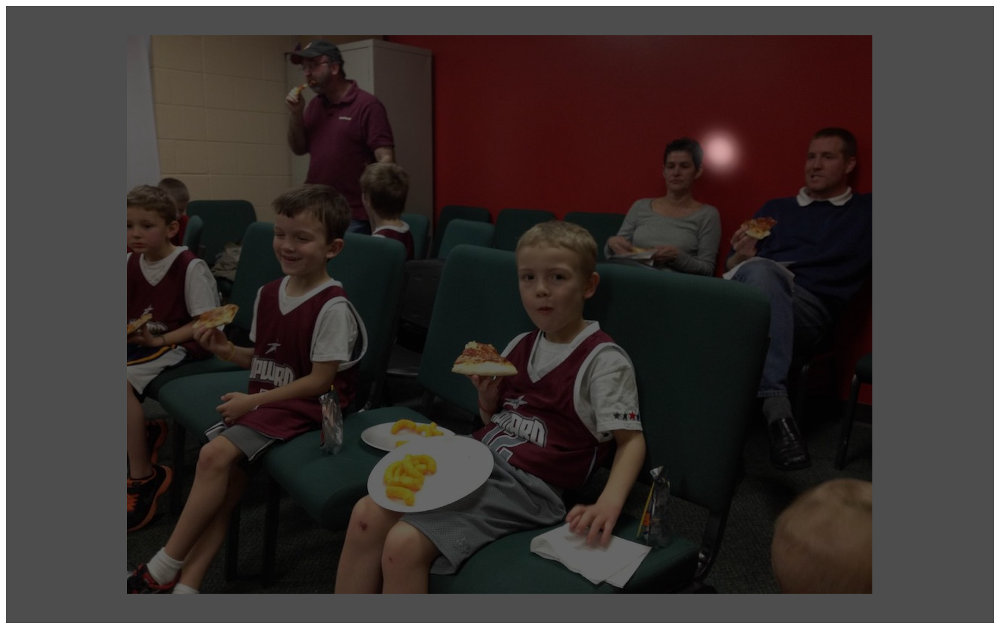

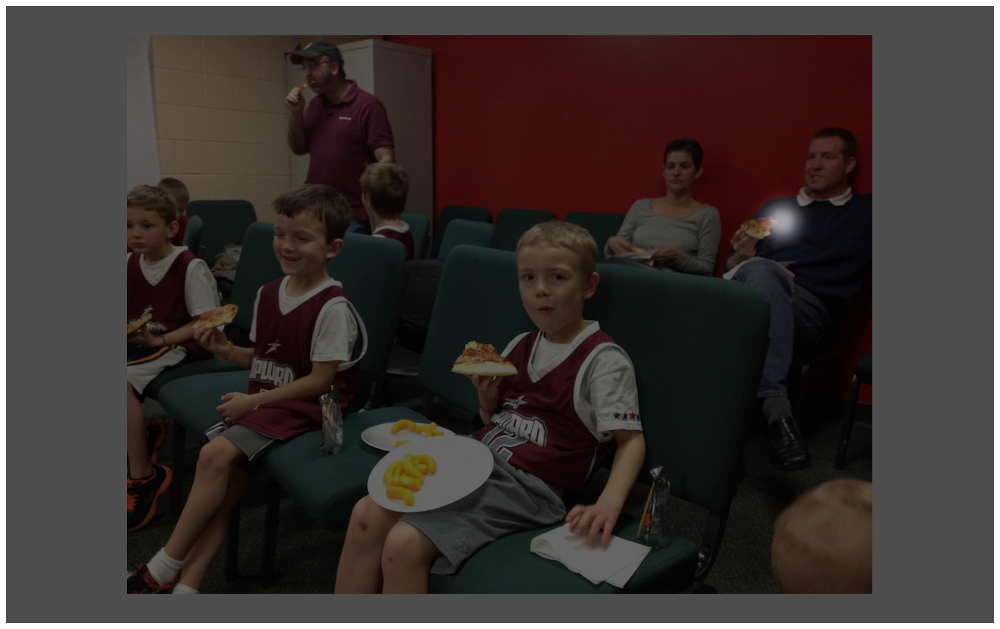

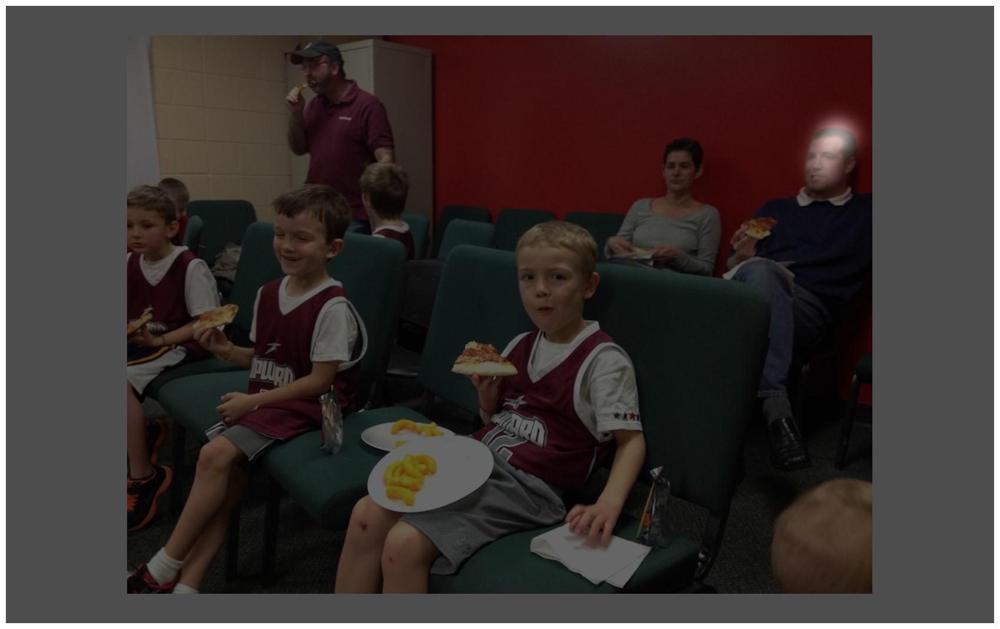

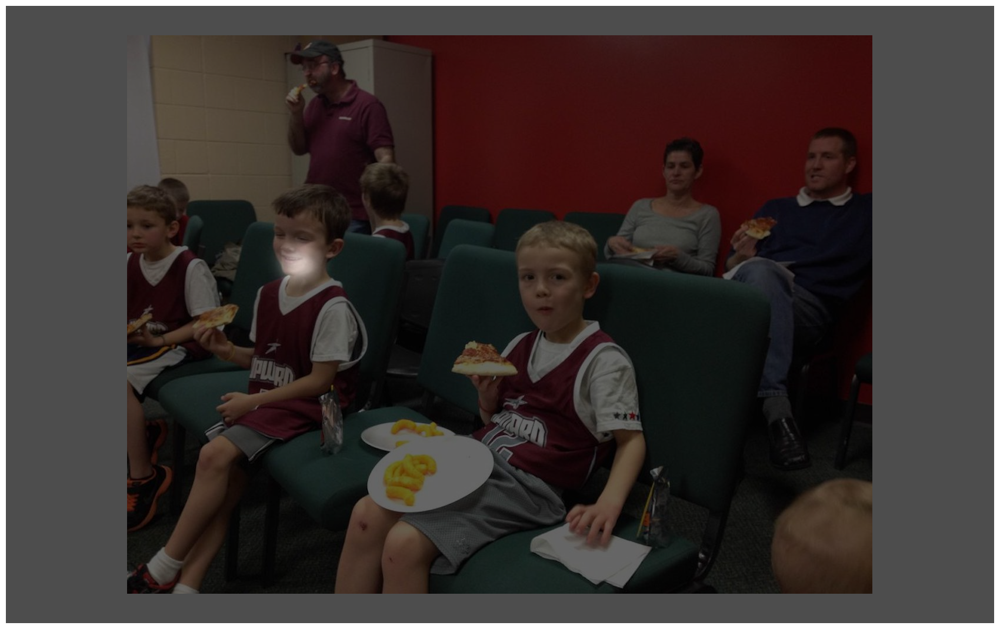

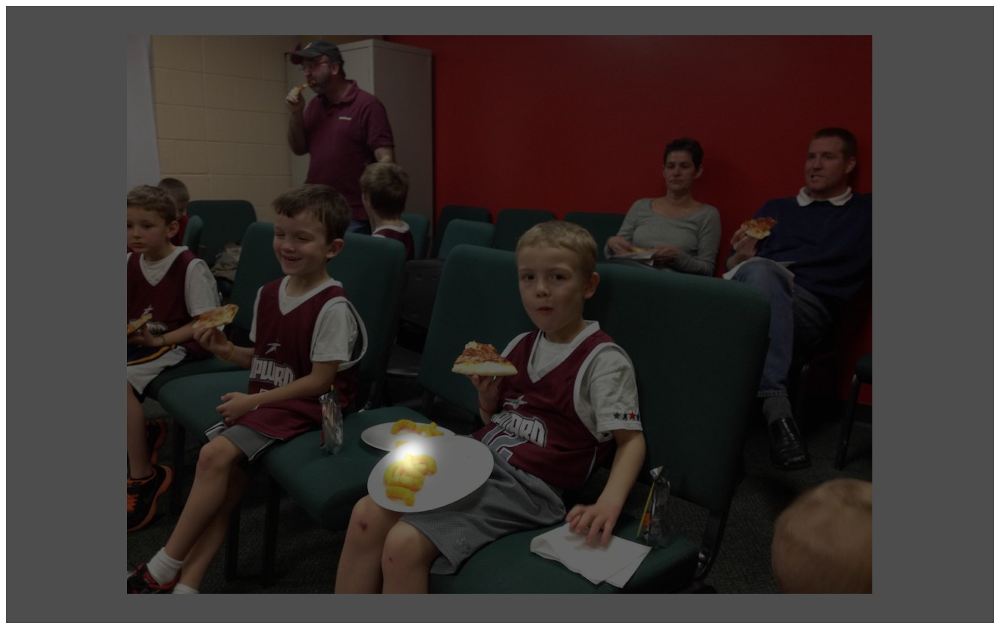

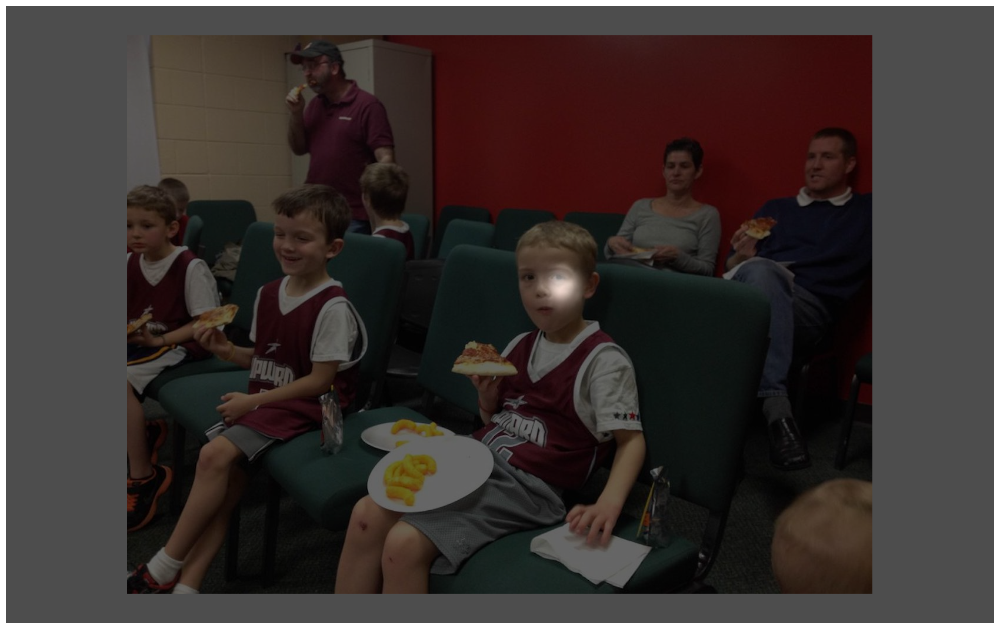

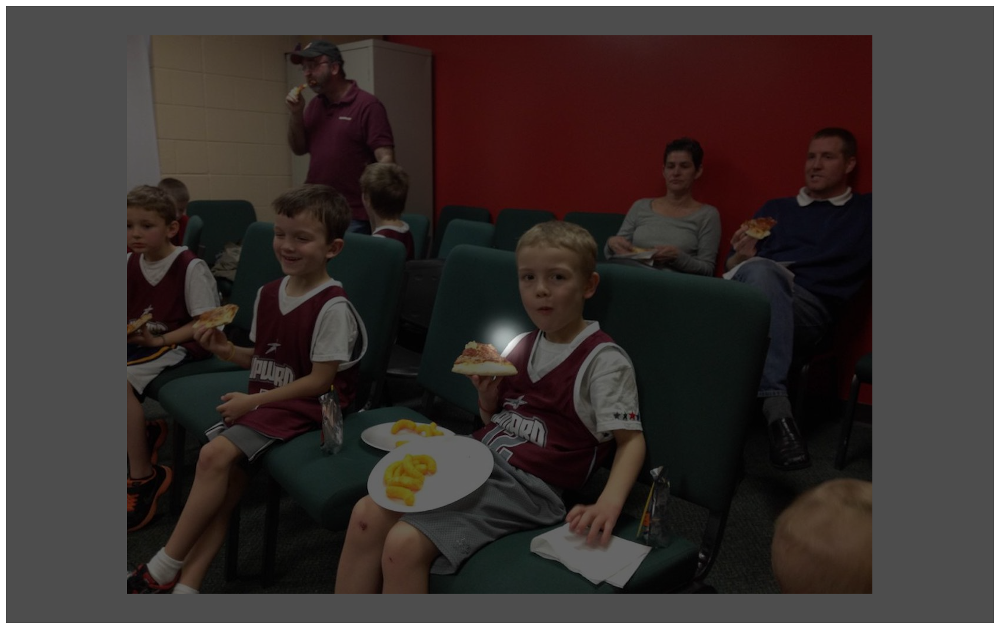

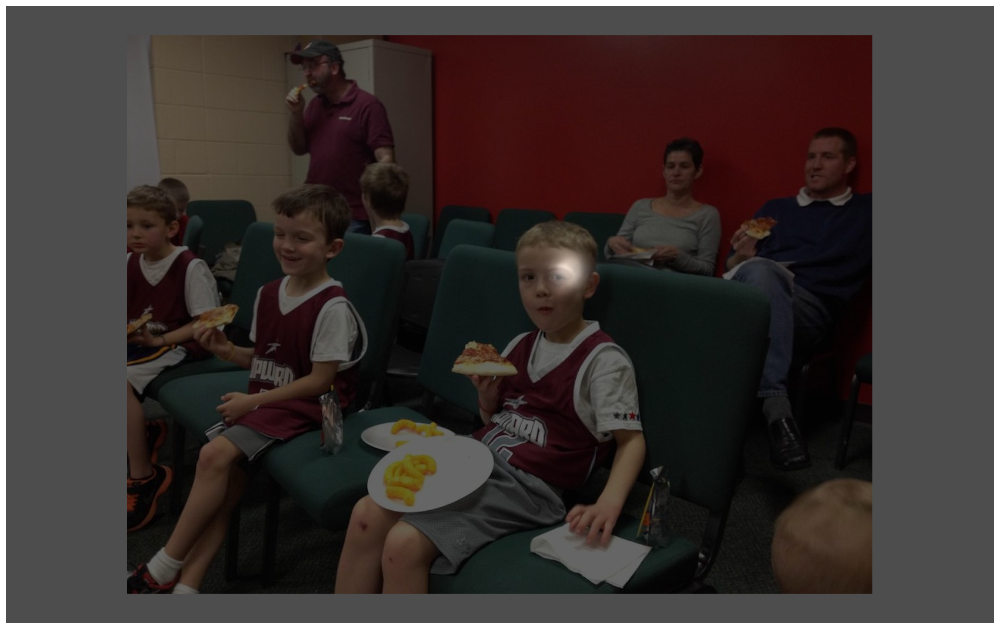

In [262]:
df = pd.read_csv('stim_df.csv')
    
counter = 0    

for idx,row in df[df['list']==1].iterrows():
    
    if counter < 1:
        free_view   = get_gaze(row['subject'],row['list'],int(row['sub_version']),row['image'])

        free_fixies = get_fixies(free_view) 
        free_dicts  = make_the_dicts(free_view)

        #movie_maker(free_fixies, free_dicts, row['list'], row['sub_version'], 'veridical', isolated=False)
        movie_maker(free_fixies, free_dicts, row['list'], row['sub_version'], 'scrambled', isolated=False)
    
    counter += 1

### Graveyard

In [38]:
# df = pd.read_csv('/Users/kirstenziman/Desktop/Desktop/DIDEC_entire_corpus/Free_viewing/List2_ALL/pp54/eye/stim_need_L2.csv')
# df = pd.read_csv('stim_need_L1.csv')
# df = pd.read_csv('stim_need_L2.csv')

In [39]:
# df = pd.read_csv('example.csv')

In [40]:
# df

In [41]:
# df_seventy

In [42]:
# df.loc[df['list']==3,'other_image'] = np.nan
# df_three = df[df['list']==3]


df_seventy = pd.read_csv('stim_70.csv')
df.loc[df['list']==3,'mismatch_image'] = list(df_seventy['0'])

In [43]:
df_three = df[df['list']==3]

In [44]:
# in df_three:
# - use 'mismatch image' as background image (from all_images folder)
# - use attention from 'image'

df_three

,Unnamed: 0,Unnamed: 1,list,subject,image,sub_version,mismatch_image
140,List3,0,3,pp73,498405.bmp,1,713652.bmp
141,List3,1,3,pp60,1160158.bmp,2,498405.bmp
142,List3,2,3,pp91,285684.bmp,1,713779.bmp
143,List3,3,3,pp55,286058.bmp,1,1592286.bmp
144,List3,4,3,pp80,285766.bmp,2,1592971.bmp
...,...,...,...,...,...,...,...
205,List3,65,3,pp59,1160171.bmp,1,713796.bmp
206,List3,66,3,pp91,1592027.bmp,1,1159829.bmp
207,List3,67,3,pp100,498261.bmp,1,285905.bmp
208,List3,68,3,pp56,498024.bmp,2,1592314.bmp


In [45]:
# df_three.head()
# print(idx)

In [46]:
# for each of the randomly selected images:
    
#     - identify which list it's from
#     - randomly pull a subject from that list

In [47]:
one_images = os.listdir('/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List 1/')
two_images = os.listdir('/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List 2/')
thr_images = os.listdir('/Users/kirstenziman/Downloads/images_with_borders/Images_resized_greyborders/List 3/')

In [48]:
print(len(one_images))
print(len(two_images))
print(len(thr_images))

104
102
102


In [49]:
all_images = one_images + two_images + thr_images
all_images

['1160062.bmp',
 '1592017.bmp',
 '1159973.bmp',
 '1159967.bmp',
 '713330.bmp',
 '1159768.bmp',
 '1592836.bmp',
 '1592189.bmp',
 '1593056.bmp',
 '498025.bmp',
 '1159353.bmp',
 '713858.bmp',
 '1593041.bmp',
 '1159408.bmp',
 '285992.bmp',
 '713652.bmp',
 '.DS_Store',
 '713450.bmp',
 '1592372.bmp',
 '1159425.bmp',
 '107906.bmp',
 '1159427.bmp',
 '1591876.bmp',
 '713888.bmp',
 '1593047.bmp',
 '1591838.bmp',
 '285851.bmp',
 '498326.bmp',
 '1159508.bmp',
 '1591781.bmp',
 '713024.bmp',
 '1159440.bmp',
 '1592934.bmp',
 '285933.bmp',
 '1159318.bmp',
 '1160189.bmp',
 '1592857.bmp',
 '713769.bmp',
 '285932.bmp',
 '1593146.bmp',
 '713786.bmp',
 '61513.bmp',
 '1591977.bmp',
 '150432.bmp',
 '713593.bmp',
 '1592501.bmp',
 '498108.bmp',
 '713418.bmp',
 '497950.bmp',
 '713633.bmp',
 '1159486.bmp',
 '498280.bmp',
 '285905.bmp',
 '1160140.bmp',
 '497974.bmp',
 '1592874.bmp',
 '713788.bmp',
 '1592530.bmp',
 '1159463.bmp',
 '498339.bmp',
 '713371.bmp',
 '1592137.bmp',
 '713760.bmp',
 '1592094.bmp',
 '498258

In [50]:
used = list(df['image'])
not_used_one = [x for x in one_images if x not in used]
not_used_two = [x for x in two_images if x not in used]
not_used_thr = [x for x in thr_images if x not in used]

not_used = not_used_one + not_used_two + not_used_thr
not_used_first_two = not_used_one + not_used_two

In [51]:
len(not_used)

98

In [52]:
len(subs_1)

NameError: name 'subs_1' is not defined

In [53]:
subs_1 = ['pp51', 'pp57', 'pp63', 'pp68', 'pp75', 'pp81', 'pp93', 'pp98',  'pp151', 'pp154', 'pp52', 'pp58', 'pp64', 'pp71', 'pp76', 'pp89']
subs_2 = ['pp53', 'pp61', 'pp70', 'pp82', 'pp88', 'pp94', 'pp95', 'pp99',  'pp152', 'pp54',  'pp62', 'pp67', 'pp79', 'pp86', 'pp90', 'pp96']
subs_3 = ['pp55', 'pp59', 'pp65', 'pp73', 'pp77', 'pp84', 'pp91', 'pp100', 'pp153', 'pp56',  'pp60', 'pp69', 'pp80', 'pp85', 'pp92', 'pp97']

In [54]:
df_three['mismatch_list'] = np.nan
df_three['mismatch_subject'] = np.nan

for idx,x in df_three.iterrows():
    if x['mismatch_image'] in not_used_one:
        df_three.loc[idx,'mismatch_list']=1
        df_three.loc[idx,'mismatch_subject'] = random.sample(subs_1,1)

    elif x['mismatch_image'] in not_used_two:
        df_three.loc[idx,'mismatch_list']=2
        df_three.loc[idx,'mismatch_subject'] = random.sample(subs_2,1)

    elif x['mismatch_image'] in not_used_thr:

        df_three.loc[idx,'mismatch_list']=3
        df_three.loc[idx,'mismatch_subject'] = random.sample(subs_3,1)
        
        while df_three.loc[idx,'mismatch_subject'] == df_three.loc[idx,'subject']:
            df_three.loc[idx,'mismatch_subject'] = random.sample(subs_3,1)
        

/usr/local/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


In [55]:
df_three

,Unnamed: 0,Unnamed: 1,list,subject,image,sub_version,mismatch_image,mismatch_list,mismatch_subject
140,List3,0,3,pp73,498405.bmp,1,713652.bmp,NaN,NaN
141,List3,1,3,pp60,1160158.bmp,2,498405.bmp,NaN,NaN
142,List3,2,3,pp91,285684.bmp,1,713779.bmp,NaN,NaN
143,List3,3,3,pp55,286058.bmp,1,1592286.bmp,NaN,NaN
144,List3,4,3,pp80,285766.bmp,2,1592971.bmp,NaN,NaN
...,...,...,...,...,...,...,...,...,...
205,List3,65,3,pp59,1160171.bmp,1,713796.bmp,NaN,NaN
206,List3,66,3,pp91,1592027.bmp,1,1159829.bmp,NaN,NaN
207,List3,67,3,pp100,498261.bmp,1,285905.bmp,NaN,NaN
208,List3,68,3,pp56,498024.bmp,2,1592314.bmp,NaN,NaN


In [56]:
# df_three['mismatch_image'] = random.sample(not_used,70) 

### make mismatch stimuli

In [57]:
#free_fixies

In [58]:
free_dicts[0]['image']

IndexError: list index out of range

In [59]:
for idx,row in df_three.iterrows():
    if idx>141:
        # get gaze data for the mismatch image
        free_view   = get_gaze(sub=row['mismatch_subject'],this_list=int(row['mismatch_list']), image=row['mismatch_image'])
        free_fixies = [get_fixies(x, fifteen=False) for x in free_view]
        free_dicts = make_the_dicts(free_view, fifteen=False)
        if len(free_dicts)>0:
            free_dicts[0]['image'] = row['image']

            # then replace the image name with the original image
            # (so you will get the original image overlaid with the mismatch gaze data)



            movie_maker(free_fixies, free_dicts, stim_type='veridical', this_list=row['list'],this_version=row['sub_version'])
            #movie_maker_2(free_fixies, free_dicts, stim_type='mismatch', this_list=l,map_only=False, other=row['mismatch_image'])
        else:
            print('touble with this image and mismatch: ')
            print(row['image'])
            print(row['mismatch_image'])

ValueError: cannot convert float NaN to integer

In [60]:
free_dicts

[]

### make scramble and isolated sitmuli

In [63]:
### REMEMBER TO CHANGE BACK COUNTER IN MOVIE MAKING FUNCTION BEFORE RE-RUNNING !!!

# for idx,row in df.iterrows():

df = pd.read_csv('stim_df.csv')
    
#for idx,row in df_three.iterrows():
#for idx,row in df[df['list']==1].iterrows():
for idx,row in df[df['list']==3].iterrows():

    #if idx != 0:

    # def get_gaze(sub = 'pp151', this_list=1, this_version=1, image='image.bmp', index=0):
    if row['sub_version'] ==1.0:
        ind = 'v1_index'
    elif row['sub_version']==2.0:
        ind = 'v2_index'

    free_view   = get_gaze(sub=row['subject'],this_list=row['list'], this_version=int(row['sub_version']), image=row['image'])
    free_fixies = [get_fixies(x, fifteen=False) for x in free_view]
    free_dicts = make_the_dicts(free_view, fifteen=False)

    #~~#movie_maker(free_fixies, free_dicts, stim_type='veridical', this_list=row['list'],this_version=row['sub_version'])
#     movie_maker(free_fixies, free_dicts, stim_type='scrambled', this_list=row['list'],this_version=row['sub_version'])



    # movie_maker(free_fixies, free_dicts, stim_type='veridical', map_only=True, this_list=row['list'], this_version=row['sub_version'])
    #movie_maker(free_fixies, free_dicts, stim_type='scrambled', map_only=True, this_list=row['list'], this_version=row['sub_version'])


    #movie_maker(free_fixies, free_dicts, stim_type='veridical', this_list=row['list'],this_version=row['sub_version'])
    #~~#movie_maker_2(free_fixies, free_dicts, stim_type='mismatch', this_list=l,map_only=False, other=row['mismatch_image'])

        
# NOTE TO SELF:
# SWITCH THE IMAGE AND MISMATCH IMAGE IF I WANT THE SAME BACKGROUND PICTURE WITH DIFFERENT ATTENTION?
        

#         # get the list # for the mismatch image
#         if row['mismatch_image'] in one_images:
#             l = '1'
#         elif row['mismatch_image'] in two_images:
#             l = '2'
#         else:
#             l = '3'

#         # make the path for that image


#         movie_maker_2(free_fixies, free_dicts, stim_type='mismatch', this_list=l,map_only=False, other=row['mismatch_image'])


xs from make_the_dicts
[1      828.47
2      829.73
3      831.69
4      832.46
5      833.96
        ...  
739    839.33
740    838.34
741    837.84
742    838.07
743    836.65
Name: L POR X [px], Length: 641, dtype: float64]
Reportedly, pp60 has no values in df for this image: 1160158.bmp
xs from make_the_dicts
[]
xs from make_the_dicts
[1      860.40
2      859.47
3      858.91
4      854.96
5      854.66
        ...  
739    724.32
740    725.22
741    723.25
742    720.47
743    694.02
Name: L POR X [px], Length: 575, dtype: float64]
xs from make_the_dicts
[1       844.48
2       843.20
3       842.29
4       842.15
5       842.38
        ...   
722    1288.89
723    1290.14
724    1290.38
725    1292.59
726    1292.81
Name: L POR X [px], Length: 610, dtype: float64]


KeyboardInterrupt: 

In [ ]:
free_fixies

In [ ]:
row['image']

In [ ]:
this_list = 2
sub = 'pp54'
this_version = 2
image = '1591954.bmp'

path      = 'List'+str(this_list)+'_ALL/' #version'+str(this_version)+'/'
p         = '../Free_viewing/'+path
free_view = []

for subject in [sub]:

    if subject!='.DS_Store' and subject!='.':
        subdir = p+subject+'/eye'

        eye_trials = os.listdir(subdir)

        for trial in eye_trials:

            if trial!='.DS_Store' and trial[-3:]!='csv':

                null = 0

                dat_string = subdir+'/'+trial
                df         = pd.read_csv(dat_string, sep=" ", skiprows=None, skipinitialspace=True, skip_blank_lines=True, header=41)
                splitso    = df['Time\tType\tTrial\tL'].str.split('\t', expand=True)
                splitso    = splitso.rename(columns={0: "Time", 1: "Type", 2:"Trial", 3:"L POR X [px]",
                                                     4:"L POR Y [px]", 5:"R POR X [px]", 6:"R POR Y [px]",
                                                     7:"Timing", 8:"Pupil Confidence", 9:"L Plane", 10:"R Plane",
                                                     11:"L Event Info", 12:"R Event Info", 13:"Stimulus"})
                splitso = splitso[1:]
                splitso['L POR X [px]'] = splitso['L POR X [px]'].astype(float)
                splitso['L POR Y [px]'] = splitso['L POR Y [px]'].astype(float)
                splitso['subject']      = subject
                splitso['list']         = this_list
                splitso['version']      = this_version
                
                free_view.append(splitso)

#                 # print(splitso.columns)

#                 if splitso[splitso['Stimulus']==image].shape[0]>0:
#                     free_view.append(splitso[splitso['Stimulus']==image])
#                     null+=1

#                 elif 15 in splitso.keys():
#                     # print('yabba dabba!')
#                     fifteen_image = splitso[15].unique()
#                     print(fifteen_image)
#                     print()
#                     if image==fifteen_image:
#                         free_view.append(splitso[splitso[15]==image])
#                         null+=1

#         if null==0:
#             print("Reportedly, "+sub+" has no values in df for this image: "+image)



                #print('free_view:')

                #print(free_view)

In [658]:
dataframes = pd.concat(free_view)

In [659]:
'1591954.bmp' in list(dataframes[15].unique())

True

In [576]:
dataframes[dataframes[15]=='1591954.bmp']



,Time,Type,Trial,L POR X [px],L POR Y [px],R POR X [px],R POR Y [px],Timing,Pupil Confidence,L Plane,R Plane,L Event Info,R Event Info,Stimulus,14,15,subject,list,version
1,65853311544,SMP,1,887.19,504.25,887.19,504.25,0,3,1,1,-1,,Fixation,Fixation,1591954.bmp,pp54,2,2
2,65853315537,SMP,1,888.09,504.27,888.09,504.27,0,3,1,1,-1,,Fixation,Fixation,1591954.bmp,pp54,2,2
3,65853319572,SMP,1,888.23,503.62,888.23,503.62,0,3,1,1,-1,,Fixation,Fixation,1591954.bmp,pp54,2,2
4,65853323601,SMP,1,890.10,503.74,890.10,503.74,0,3,1,1,-1,,Fixation,Fixation,1591954.bmp,pp54,2,2
5,65853327634,SMP,1,890.88,503.78,890.88,503.78,0,3,1,1,-1,,Fixation,Fixation,1591954.bmp,pp54,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
729,65856223211,SMP,1,1103.96,170.72,1103.96,170.72,0,3,1,1,-1,,-,-,1591954.bmp,pp54,2,2
730,65856227211,SMP,1,1105.79,168.83,1105.79,168.83,0,3,1,1,-1,,-,-,1591954.bmp,pp54,2,2
731,65856231151,SMP,1,1110.84,168.17,1110.84,168.17,0,3,1,1,-1,,-,-,1591954.bmp,pp54,2,2
732,65856235247,SMP,1,1112.44,168.12,1112.44,168.12,0,3,1,1,-1,,-,-,1591954.bmp,pp54,2,2


In [487]:
733/250.0


2.932